<p style="font-family: 'Courier New', Courier, monospace; font-size: 50px; font-weight: bold; color: blue;  text-align: center;">
  LoRaWAN Path Loss Measurements in an Indoor Setting: EXPLORATORY DATA ANALYSIS
</p>

In [2]:
# Libraries/Packages Used:

import pandas as pd                # For data manipulation and analysis.
import numpy as np                 # For numerical computations and handling arrays.
import seaborn as sns              # For statistical data visualization based on matplotlib.
from datetime import datetime, timedelta  # For handling date and time operations.
import matplotlib.pyplot as plt    # For creating static visualizations.
import plotly.graph_objs as go     # For creating interactive visualizations.
from plotly.subplots import make_subplots  # For creating interactive subplots.
import itertools                   # To cycle through colors or other iterables.

In [3]:
# Read data from a local CSV file
new_df = pd.read_csv('combined_measurements_data.csv')

# Print the info about the combined DataFrame
print("\nInfo of Combined DataFrame:\n")
new_df.info()


Info of Combined DataFrame:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8262 entries, 0 to 8261
Data columns (total 71 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   time                                                     8262 non-null   object 
 1   correlation_ids_0                                        8262 non-null   object 
 2   device_id                                                8262 non-null   object 
 3   end_device_ids_application_ids_application_id            8262 non-null   object 
 4   end_device_ids_dev_addr                                  8262 non-null   object 
 5   end_device_ids_dev_eui                                   8262 non-null   object 
 6   end_device_ids_device_id                                 8262 non-null   object 
 7   end_device_ids_join_eui                                  8262 non-null   int64  
 8 

C:\Users\User\AppData\Local\Temp\ipykernel_8424\2988560942.py:2: DtypeWarning: Columns (40,41,42,45,47) have mixed types. Specify dtype option on import or set low_memory=False.
  new_df = pd.read_csv('combined_measurements_data.csv')


<p style="font-family: 'Courier New', Courier, monospace; font-size: 30px; font-weight: bold; color: blue;  text-align: left;">
  Creating the assorted/aggregated measurements Dataframe
</p>

In [5]:
# Columns to keep and their new names
columns_to_keep = {
    'time': 'time',
    'end_device_ids_device_id': 'device_id',
    'uplink_message_decoded_payload_co2': 'co2',
    'uplink_message_decoded_payload_humidity': 'humidity',
    'uplink_message_decoded_payload_pm25': 'pm25',
    'uplink_message_decoded_payload_pressure': 'pressure',
    'uplink_message_decoded_payload_temperature': 'temperature',
    'uplink_message_rx_metadata_0_rssi': 'rssi',
    'uplink_message_rx_metadata_0_snr': 'snr',
    'uplink_message_settings_data_rate_lora_spreading_factor': 'SF',
    'uplink_message_settings_frequency': 'frequency',
    'uplink_message_f_cnt': 'f_count',
    'uplink_message_decoded_payload_packetCount' : 'p_count',
    'uplink_message_consumed_airtime' : 'toa'
}

# Select and rename the columns
cleaned_df = new_df[list(columns_to_keep.keys())].rename(columns=columns_to_keep)

# Adding distance column based on device_id
# Define a mapping dictionary for distances
distance_map = {
    'pilotdevice01': 0.02,
    'pilotdevice02': 0.05,
    'pilotdevice': 0.07
}

# Use .map() to add the distance column
cleaned_df['distance'] = cleaned_df['device_id'].map(distance_map)


# Convert the 'frequency' column to numeric, forcing errors to NaN (in case of non-numeric values)
cleaned_df['frequency'] = pd.to_numeric(cleaned_df['frequency'], errors='coerce')
# Converting frequency to MHz from Hz
cleaned_df['frequency'] = cleaned_df['frequency'] / 1e6

# Remove 's' from the 'toa' column and convert to numeric
cleaned_df['toa'] = cleaned_df['toa'].str.rstrip('s').astype(float)

# Add new columns and a calculated column of experimental_pl
cleaned_df = cleaned_df.assign(tx_p=14,
               tx_cl=1, #Transmitter Cable Losses in dB
               tx_ag=0.4, #Transmitter antenna gain in dBM
               rx_ag=3, #Receiver antenna gain in dBM
               exp_pl=lambda x: x['tx_p'] - x['tx_cl'] + x['tx_ag'] + x['rx_ag'] -  x['rssi']) 
                            #Calculating the experimental Path loss

# Save the aggref=gated DataFrame to a local csv file and Display its Information.

new_df.to_csv('aggregated_measurements_data.csv', index=False)

<p style="font-family: 'Courier New', Courier, monospace; font-size: 30px; font-weight: bold; color: blue;  text-align: left;">
  Visual Dataframe Cleaning
</p>

In [7]:

# Exclude sf12 datapoints
#cleaned_df = cleaned_df[cleaned_df['SF'] != 12]
# Remove rows with temperature above 30
cleaned_df = cleaned_df[~(cleaned_df['temperature'] > 30)]
# Remove rows with humidity below 20
#cleaned_df = cleaned_df[~(cleaned_df['humidity'] < 20)]
# Remove rows with rssi less than -70
#cleaned_df = cleaned_df[~(cleaned_df['rssi'] < -85)]

# For 'pilotdevice':
# cleaned_df = cleaned_df[~((cleaned_df['device_id'] == 'pilotdevice01') & 
                         #  ((cleaned_df['rssi'] <= -45) | (cleaned_df['rssi'] > -20)))]

# For 'pilotdevice01' keep between -65 and -45, remove the rest:
# cleaned_df = cleaned_df[~((cleaned_df['device_id'] == 'pilotdevice') & 
                          # ((cleaned_df['rssi'] <= -63) | (cleaned_df['rssi'] > -45)))]


# Remove rows with snr is negative
#cleaned_df = cleaned_df[~(cleaned_df['snr'] < 0)]

# Save all data to csv
cleaned_df.to_csv('visually_cleaned_df.csv', index=False)

# Display the cleaned Dataframe Info
print("\nInfo of Combined DataFrame:\n")
cleaned_df.info()

# Display the cleaned Dataframe Head and Tail
print("\nCleaned DataFrame:\n")
cleaned_df



Info of Combined DataFrame:

<class 'pandas.core.frame.DataFrame'>
Index: 8197 entries, 0 to 8261
Data columns (total 20 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   time         8197 non-null   object 
 1   device_id    8197 non-null   object 
 2   co2          3038 non-null   float64
 3   humidity     8197 non-null   float64
 4   pm25         8197 non-null   float64
 5   pressure     8197 non-null   float64
 6   temperature  8197 non-null   float64
 7   rssi         8197 non-null   float64
 8   snr          8196 non-null   float64
 9   SF           8197 non-null   float64
 10  frequency    8197 non-null   float64
 11  f_count      8196 non-null   float64
 12  p_count      8197 non-null   float64
 13  toa          8197 non-null   float64
 14  distance     8197 non-null   float64
 15  tx_p         8197 non-null   int64  
 16  tx_cl        8197 non-null   int64  
 17  tx_ag        8197 non-null   float64
 18  rx_ag        8197 non-n

,time,device_id,co2,humidity,pm25,pressure,temperature,rssi,snr,SF,frequency,f_count,p_count,toa,distance,tx_p,tx_cl,tx_ag,rx_ag,exp_pl
0,2024-09-05 13:44:17.417944+02:00,pilotdevice02,NaN,71.61,15.29,320.99,25.11,-41.0,8.8,12.0,867.3,1.0,1.0,1.646592,0.05,14,1,0.4,3,57.4
1,2024-09-05 13:44:18.782852+02:00,pilotdevice,437.0,57.83,14.62,320.00,25.70,-57.0,13.8,10.0,867.1,861.0,943.0,0.452608,0.07,14,1,0.4,3,73.4
2,2024-09-05 13:44:39.456562+02:00,pilotdevice01,NaN,68.00,18.23,320.86,26.34,-35.0,8.8,12.0,867.1,1.0,1.0,1.646592,0.02,14,1,0.4,3,51.4
3,2024-09-05 13:45:18.846303+02:00,pilotdevice,438.0,57.83,15.46,319.95,25.72,-57.0,13.0,10.0,868.3,862.0,944.0,0.452608,0.07,14,1,0.4,3,73.4
4,2024-09-05 13:45:45.725157+02:00,pilotdevice02,NaN,71.26,15.02,320.97,25.11,-39.0,10.2,12.0,868.3,2.0,2.0,1.646592,0.05,14,1,0.4,3,55.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8257,2024-09-07 20:27:07.816910+02:00,pilotdevice01,NaN,59.70,234.53,323.74,27.95,-34.0,7.2,10.0,867.5,3154.0,3281.0,0.411648,0.02,14,1,0.4,3,50.4
8258,2024-09-07 20:27:14.232845+02:00,pilotdevice,503.0,53.85,220.88,322.70,25.85,-55.0,11.0,8.0,868.3,3897.0,4223.0,0.133632,0.07,14,1,0.4,3,71.4
8259,2024-09-07 20:27:16.167430+02:00,pilotdevice02,NaN,70.13,84.96,324.04,24.79,-45.0,10.8,11.0,867.1,549.0,574.0,0.823296,0.05,14,1,0.4,3,61.4
8260,2024-09-07 20:28:07.854573+02:00,pilotdevice01,NaN,59.69,221.98,323.75,27.96,-39.0,11.0,10.0,867.1,3155.0,3282.0,0.411648,0.02,14,1,0.4,3,55.4


<p style="font-family: 'Courier New', Courier, monospace; font-size: 30px; font-weight: bold; color: blue;  text-align: left;">
  Plot for Some Dataframe variables over time
</p>

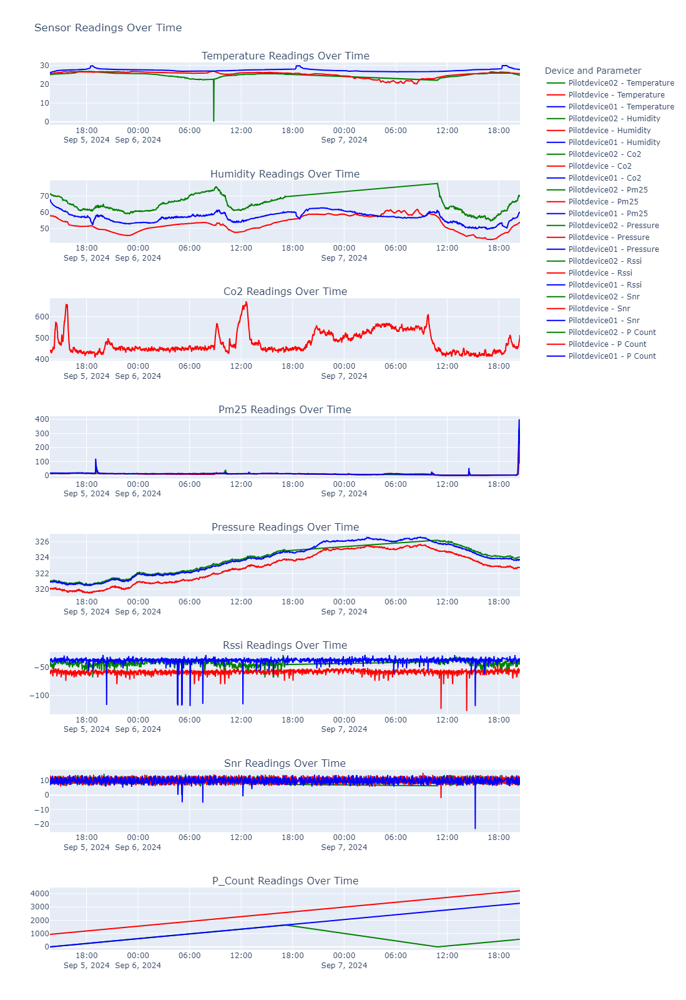

In [9]:
def plot_sensor_readings(cleaned_df, row_map):
    """
    Plots sensor readings by grouping devices and assigning colors dynamically.
    Ensures the plot is fully visible in Jupyter notebooks without scrolling.

    Args:
    - cleaned_df (DataFrame): Cleaned DataFrame containing sensor data.
    - row_map (dict): Mapping of sensor parameters to subplot rows.
    """
    # Create subplots dynamically based on the row_map provided
    fig = make_subplots(
        rows=len(row_map), cols=1, 
        subplot_titles=[f'{param.title()} Readings Over Time' for param in row_map]
    )

    # Define a pool of colors and create an iterator to cycle through them
    color_pool = itertools.cycle(['green', 'red', 'blue', 'purple', 'orange', 
                                  'cyan', 'magenta', 'brown', 'black', 'pink'])
    
    # Group by unique device IDs and assign colors dynamically
    device_colors = {device: next(color_pool) for device in cleaned_df['device_id'].unique()}

    # Plotting for each parameter and each device
    for param, row in row_map.items():
        for device, color in device_colors.items():
            # Filter data for the specific device
            data = cleaned_df[cleaned_df['device_id'] == device]
            
            # Add a trace for each parameter for the current device
            fig.add_trace(
                go.Scatter(
                    x=data['time'], 
                    y=data[param], 
                    mode='lines',  # Line plot
                    name=f"{device} - {param}".replace('_', ' ').title(),  # Clean up legend text
                    line=dict(color=color)  # Assign color from the pool
                ),
                row=row, col=1  # Place in the correct subplot
            )

    # Update layout with fixed height and other settings
    fig.update_layout(
        height=1600,  # Fixed height to accommodate all subplots
        showlegend=True,  # Show legend
        title_text="Sensor Readings Over Time",  # Overall plot title
        legend=dict(title="Device and Parameter", x=1.05, y=1)  # Adjust legend position
    )

    # Show the plot
    fig.show()

# Example usage:
# Define the row mapping for parameters; you can modify this as needed
row_map = {
    'temperature': 1, 'humidity': 2, 'co2': 3, 'pm25': 4, 
    'pressure': 5, 'rssi': 6, 'snr': 7, 'p_count': 8
}

# Call the function with the cleaned DataFrame and row_map
plot_sensor_readings(cleaned_df, row_map)

<p style="font-family: 'Courier New', Courier, monospace; font-size: 30px; font-weight: bold;
color: blue;  text-align: left;">
  Statistical Description
</p>

In [11]:
# Generate the statistical description of the cleaned DataFrame
stat_description = cleaned_df.describe().transpose()

# Set the display format for floating-point numbers to xx decimal places
pd.options.display.float_format = '{:,.3f}'.format 

# Save the statistical description to an Excel file
excel_path = "statistical_description.xlsx"
stat_description.to_excel(excel_path)

# Display the statistical description
stat_description

,count,mean,std,min,25%,50%,75%,max
co2,"3,038.000",476.012,50.376,407.000,441.000,453.000,512.000,672.000
humidity,"8,197.000",57.261,6.131,43.050,53.130,57.480,60.870,77.730
pm25,"8,197.000",11.108,14.773,0.850,7.260,11.820,13.440,402.270
pressure,"8,197.000",323.236,1.951,319.470,321.450,323.500,324.940,326.610
temperature,"8,197.000",26.088,1.650,0.000,25.480,26.350,27.190,29.990
rssi,"8,197.000",-46.587,10.206,-128.000,-57.000,-43.000,-38.000,-28.000
snr,"8,196.000",10.270,1.772,-23.500,9.000,10.200,11.800,15.500
SF,"8,197.000",9.387,1.676,7.000,8.000,9.000,11.000,12.000
frequency,"8,197.000",867.838,0.464,867.100,867.500,867.900,868.300,868.500
f_count,"8,196.000","1,632.619","1,050.750",1.000,757.000,"1,474.500","2,487.250","3,898.000"


<p style="font-family: 'Courier New', Courier, monospace; font-size: 30px; font-weight: bold;
color: blue;  text-align: left;">
  Correlation Matrix and the HeatMap
</p>

In [13]:
# Select only the numeric columns
numeric_df = cleaned_df.select_dtypes(include='number')

# Compute the correlation matrix
correlation_matrix = numeric_df.corr()

# Set the display format for floating-point numbers to xx decimal places
pd.options.display.float_format = '{:,.3f}'.format 

# List of columns (and corresponding rows) to remove from the correlation matrix
columns_to_remove = ['tx_p', 'tx_cl', 'tx_ag', 'rx_ag']

# Drop the specified rows and columns from the correlation matrix
cleaned_correlation_matrix = correlation_matrix.drop(columns=columns_to_remove, index=columns_to_remove)

# Display the Correlation Matrix
cleaned_correlation_matrix

,co2,humidity,pm25,pressure,temperature,rssi,snr,SF,frequency,f_count,p_count,toa,distance,exp_pl
co2,1.000,0.553,0.094,0.413,-0.546,0.086,0.010,0.014,0.008,0.122,0.123,0.010,NaN,-0.086
humidity,0.553,1.000,0.129,0.194,-0.346,0.425,-0.006,0.007,0.002,-0.445,-0.448,-0.025,-0.224,-0.425
pm25,0.094,0.129,1.000,-0.174,0.063,0.043,-0.001,0.005,-0.006,-0.118,-0.117,0.003,-0.050,-0.043
pressure,0.413,0.194,-0.174,1.000,-0.226,0.208,-0.014,0.000,0.010,0.514,0.498,-0.009,-0.226,-0.208
temperature,-0.546,-0.346,0.063,-0.226,1.000,0.391,0.001,0.011,-0.006,-0.217,-0.238,-0.017,-0.613,-0.391
rssi,0.086,0.425,0.043,0.208,0.391,1.000,-0.008,0.043,0.019,-0.403,-0.430,-0.023,-0.833,-1.000
snr,0.010,-0.006,-0.001,-0.014,0.001,-0.008,1.000,-0.061,-0.206,-0.006,-0.004,-0.249,0.008,0.008
SF,0.014,0.007,0.005,0.000,0.011,0.043,-0.061,1.000,0.073,-0.013,-0.013,0.900,-0.019,-0.043
frequency,0.008,0.002,-0.006,0.010,-0.006,0.019,-0.206,0.073,1.000,0.011,0.011,0.075,0.005,-0.019
f_count,0.122,-0.445,-0.118,0.514,-0.217,-0.403,-0.006,-0.013,0.011,1.000,0.999,0.023,0.274,0.403


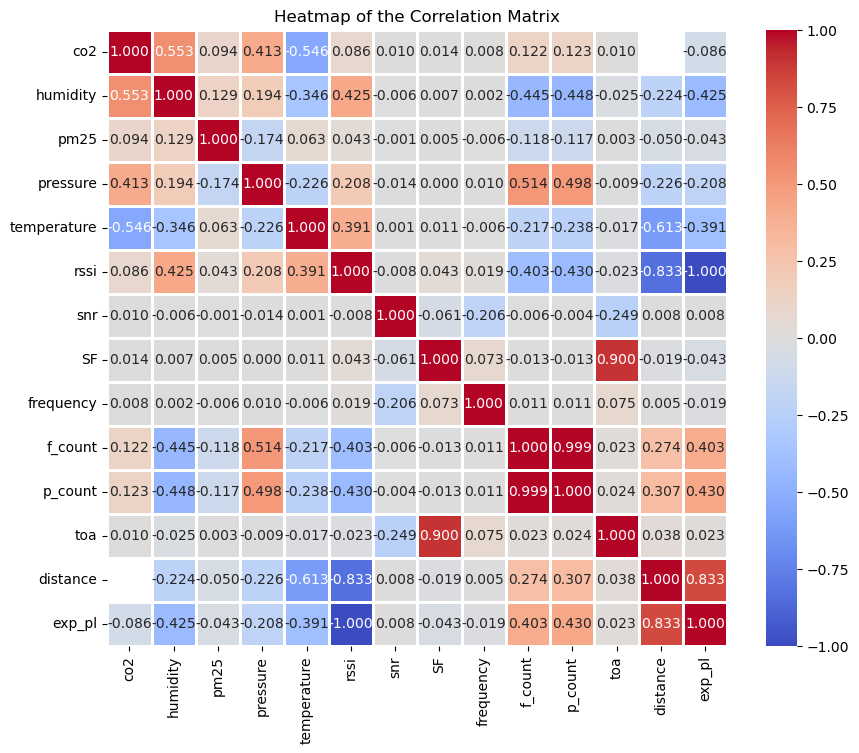

In [14]:
# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cleaned_correlation_matrix, annot=True, cmap='coolwarm', fmt='.3f', linewidths=0.8)
plt.title('Heatmap of the Correlation Matrix')
plt.show()

In [15]:
#Single out RSSI and sort the values
numeric_df.corr()['rssi'].sort_values()

exp_pl        -1.000
distance      -0.833
p_count       -0.430
f_count       -0.403
toa           -0.023
snr           -0.008
frequency      0.019
pm25           0.043
SF             0.043
co2            0.086
pressure       0.208
temperature    0.391
humidity       0.425
rssi           1.000
tx_p             NaN
tx_cl            NaN
tx_ag            NaN
rx_ag            NaN
Name: rssi, dtype: float64

<p style="font-family: 'Courier New', Courier, monospace; font-size: 30px; font-weight: bold; color: blue;  text-align: left;">
  Packet Delivery Ratio (PDR)
</p>

In [17]:
# Grouping data by device_id
grouped = cleaned_df.groupby('device_id')

# Calculating the maximum p_count (Total Sent Packets) 
#and maximum f_count (Received Packets) for each device
pdr_table = grouped.agg(
    total_sent_packets=('p_count', 'max'), # Use the maximum value of p_count
    received_packets=('f_count', 'max')  # Use the maximum value of f_count
)

# Calculating the PDR
pdr_table['PDR (%)'] = (pdr_table['received_packets'] / pdr_table['total_sent_packets']) * 100

# Displaying the result as a table
pdr_table

,total_sent_packets,received_packets,PDR (%)
device_id,,,
pilotdevice,"4,224.000","3,898.000",92.282
pilotdevice01,"3,282.000","3,155.000",96.130
pilotdevice02,"1,647.000","1,519.000",92.228


<p style="font-family: 'Courier New', Courier, monospace; font-size: 30px; font-weight: bold; color: blue;  text-align: left;">
 Scatter Plots : SNR vs RSSI for each Devices
</p>

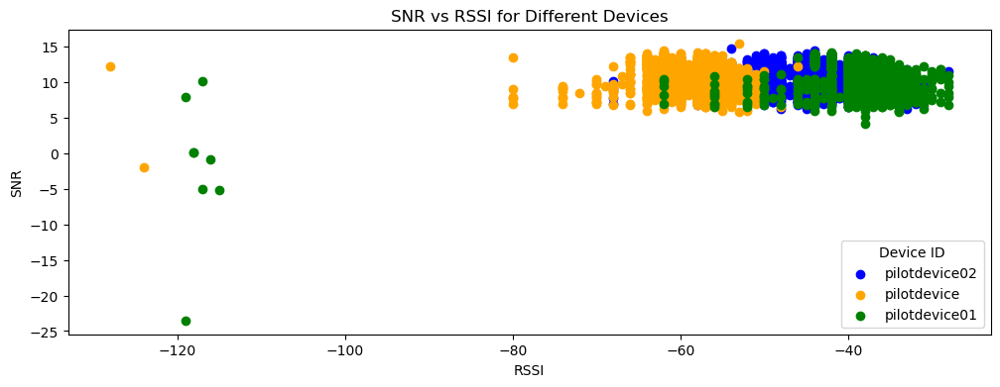

In [19]:
def plot_snr_vs_rssi(cleaned_df):
    """
    Plots SNR vs RSSI for each device dynamically using different colors.

    Args:
    - cleaned_df (DataFrame): Cleaned DataFrame containing sensor data with 'rssi' and 'snr' columns.
    """
    # Define a pool of colors and create an iterator to cycle through them
    color_pool = itertools.cycle(['blue', 'orange', 'green', 'red', 'purple', 
                                  'cyan', 'magenta', 'brown', 'black', 'pink'])

    # Create a figure for plotting
    plt.figure(figsize=(12, 4))

    # Group by unique device IDs and assign colors dynamically
    for device, color in zip(cleaned_df['device_id'].unique(), color_pool):
        # Filter data for each device
        subset = cleaned_df[cleaned_df['device_id'] == device]
        # Scatter plot for SNR vs RSSI
        plt.scatter(subset['rssi'], subset['snr'], label=device, color=color)

    # Add labels, legend, and title
    plt.xlabel('RSSI')
    plt.ylabel('SNR')
    plt.legend(title='Device ID')
    plt.title('SNR vs RSSI for Different Devices')

    # Show the plot
    plt.show()

# Example usage:
plot_snr_vs_rssi(cleaned_df)


<p style="font-family: 'Courier New', Courier, monospace; font-size: 30px; font-weight: bold; color: blue;  text-align: left;">
 Exploration of LoRAWAN Parameters based on the Spreading Factor
</p>

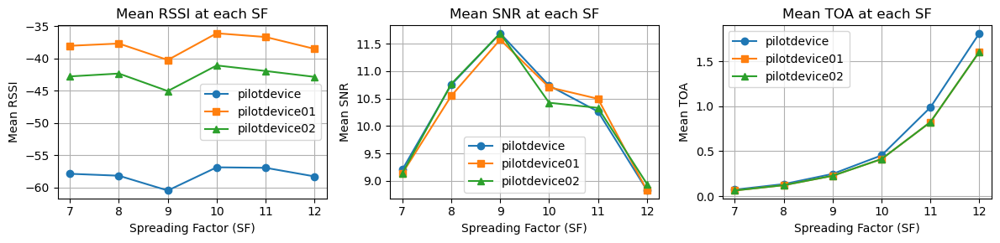

In [21]:
def plot_mean_metric(ax, cleaned_df, metric, ylabel, title):
    """
    Plots the mean of a specified metric grouped by Spreading Factor (SF) for each device.

    Args:
    - ax (Axes): Matplotlib Axes object to plot on.
    - cleaned_df (DataFrame): DataFrame containing sensor data with 'device_id', 'SF', and metric columns.
    - metric (str): The metric to plot (e.g., 'rssi', 'snr', 'toa').
    - ylabel (str): The label for the y-axis.
    - title (str): The title of the plot.
    """
    # Define a pool of markers to use for different devices
    marker_pool = itertools.cycle(['o', 's', '^', 'D', 'v', 'P', '*'])
    
    # Group by device and calculate mean metric for each SF
    for device_id, device_data in cleaned_df.groupby('device_id'):
        mean_metric = device_data.groupby('SF')[metric].mean()
        # Plot mean metric for each device with a different marker
        ax.plot(mean_metric.index, mean_metric.values, marker=next(marker_pool), linestyle='-', label=device_id)
    
    # Set labels and title
    ax.set_xlabel('Spreading Factor (SF)')
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend()
    ax.grid(True)

# Set up the matplotlib figure with subplots (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(12, 3))

# Plot mean RSSI
plot_mean_metric(axes[0], cleaned_df, 'rssi', 'Mean RSSI', 'Mean RSSI at each SF')

# Plot mean SNR
plot_mean_metric(axes[1], cleaned_df, 'snr', 'Mean SNR', 'Mean SNR at each SF')

# Plot mean TOA
plot_mean_metric(axes[2], cleaned_df, 'toa', 'Mean TOA', 'Mean TOA at each SF')

# Adjust layout
plt.tight_layout()
plt.show()


In [22]:
# Calculate the mean of rssi and snr grouped by device_id
mean_values = cleaned_df.groupby('device_id')[['rssi', 'snr', 'toa']].mean()

# Display the mean values
mean_values

,rssi,snr,toa
device_id,,,
pilotdevice,-58.167,10.298,0.558
pilotdevice01,-37.834,10.261,0.507
pilotdevice02,-42.658,10.241,0.505


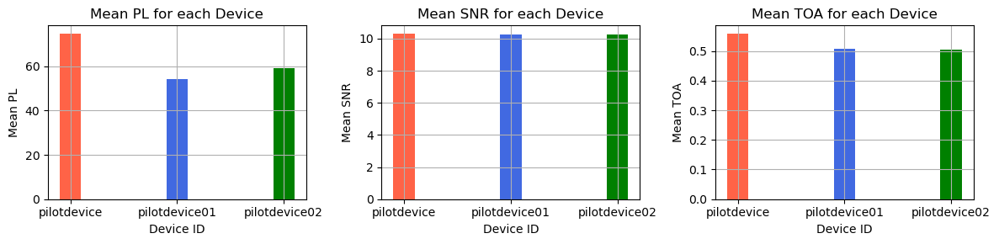

In [23]:
def plot_mean_metric(ax, cleaned_df, metric, ylabel, title, bar_width=0.4):
    """
    Plots the mean of a specified metric for each device as a bar chart.

    Args:
    - ax (Axes): Matplotlib Axes object to plot on.
    - cleaned_df (DataFrame): DataFrame containing sensor data with 'device_id' and metric columns.
    - metric (str): The metric to plot (e.g., 'exp_pl', 'snr', 'toa').
    - ylabel (str): The label for the y-axis.
    - title (str): The title of the plot.
    - bar_width (float): The width of the bars in the bar chart.
    """
    # Define a pool of colors to use for different devices
    color_pool = itertools.cycle(['tomato', 'royalblue', 'green', 'purple', 'orange', 'cyan', 'magenta'])
    
    # Calculate mean metric for each device
    mean_metrics = cleaned_df.groupby('device_id')[metric].mean()

    # Bar plot for each device with a unique color
    ax.bar(mean_metrics.index, mean_metrics.values, color=[next(color_pool) for _ in mean_metrics.index], width=bar_width)
    
    # Set labels and title
    ax.set_xlabel('Device ID')
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.grid(True)

# Set up another matplotlib figure for mean metrics (1 row, 3 columns)
fig2, axes2 = plt.subplots(1, 3, figsize=(12, 3))

# Plot mean PL
plot_mean_metric(axes2[0], cleaned_df, 'exp_pl', 'Mean PL', 'Mean PL for each Device', bar_width=0.2)

# Plot mean SNR
plot_mean_metric(axes2[1], cleaned_df, 'snr', 'Mean SNR', 'Mean SNR for each Device', bar_width=0.2)

# Plot mean TOA
plot_mean_metric(axes2[2], cleaned_df, 'toa', 'Mean TOA', 'Mean TOA for each Device', bar_width=0.2)

# Adjust layout
fig2.tight_layout()
plt.show()


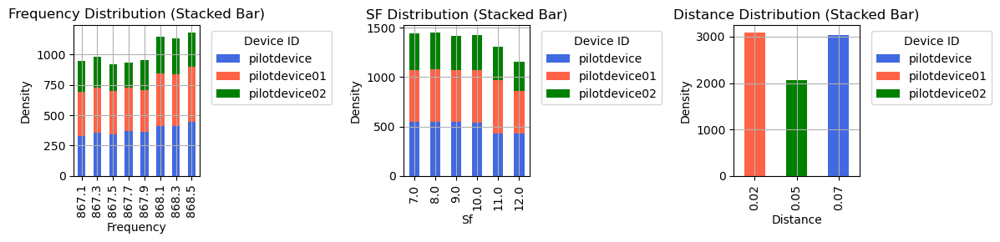

In [24]:
def plot_stacked_bar(ax, data, parameter, title=''):
    """
    Plots a stacked bar chart for the given parameter, grouping by 'device_id'.

    Args:
    - ax (Axes): Matplotlib Axes object to plot on.
    - data (DataFrame): DataFrame containing sensor data with 'device_id' and the parameter to plot.
    - parameter (str): The parameter to plot (e.g., 'frequency', 'SF', 'distance').
    - title (str): The title of the plot.
    """
    # Define a pool of colors to use for different devices
    color_pool = itertools.cycle(['royalblue', 'tomato', 'green', 'purple', 'orange', 'cyan', 'magenta'])
    
    # Pivot the data to have device_id as columns
    pivot_data = data.pivot_table(index=parameter, columns='device_id', aggfunc='size', fill_value=0)
    
    # Create a color map dynamically based on device_id
    colors = {device: next(color_pool) for device in pivot_data.columns}

    # Plot the stacked bar plot
    pivot_data.plot(kind='bar', stacked=True, ax=ax, color=[colors[device] for device in pivot_data.columns])
    
    ax.set_title(title)
    ax.set_xlabel(parameter.capitalize())
    ax.set_ylabel('Density')
    ax.grid(True)
    ax.legend(title='Device ID', bbox_to_anchor=(1.05, 1), loc='upper left')

# Filter the DataFrame (if needed) or use as is
filtered_df = cleaned_df[cleaned_df['device_id'].isin(cleaned_df['device_id'].unique())]

# Set up the matplotlib figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 3))

# Plot each parameter on a separate subplot
plot_stacked_bar(axes[0], filtered_df, 'frequency', title='Frequency Distribution (Stacked Bar)')
plot_stacked_bar(axes[1], filtered_df, 'SF', title='SF Distribution (Stacked Bar)')
plot_stacked_bar(axes[2], filtered_df, 'distance', title='Distance Distribution (Stacked Bar)')

# Adjust layout
plt.tight_layout()
plt.show()


<p style="font-family: 'Courier New', Courier, monospace; font-size: 30px; font-weight: bold; color: blue;  text-align: left;">
 KDE Plots: Environmental Parameters
</p>

C:\Users\User\AppData\Local\Temp\ipykernel_8424\3999777069.py:21: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.

C:\Users\User\AppData\Local\Temp\ipykernel_8424\3999777069.py:21: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



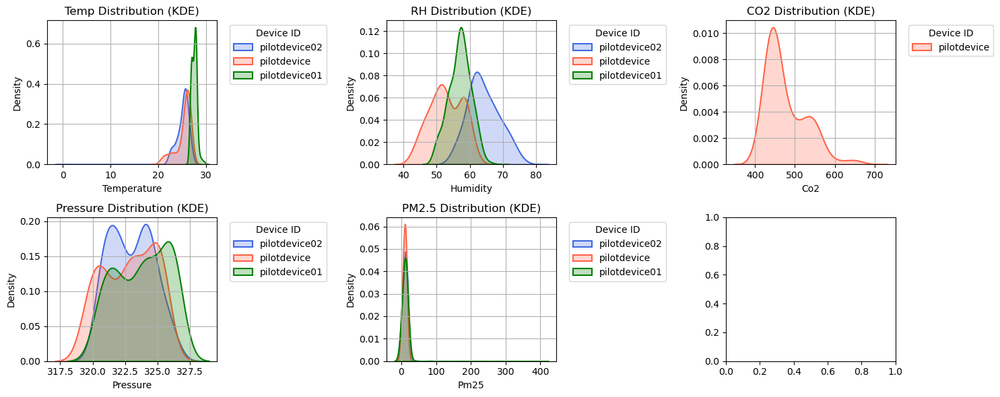

In [26]:
def plot_kde(ax, data, parameter, bw_adjust=2, title=''):
    """
    Plots a Kernel Density Estimate (KDE) for the given parameter, grouped by 'device_id'.

    Args:
    - ax (Axes): Matplotlib Axes object to plot on.
    - data (DataFrame): DataFrame containing sensor data with 'device_id' and the parameter to plot.
    - parameter (str): The parameter to plot (e.g., 'temperature', 'humidity', 'co2').
    - bw_adjust (float): Bandwidth adjustment for the KDE plot.
    - title (str): The title of the plot.
    """
    # Define a pool of colors to use for different devices
    color_pool = itertools.cycle(['royalblue', 'tomato', 'green', 'purple', 'orange', 'cyan', 'magenta'])

    # Create a color map dynamically based on device_id
    colors = {device_id: next(color_pool) for device_id in data['device_id'].unique()}

    # Plot KDE for each device
    for device_id in data['device_id'].unique():
        subset = data[data['device_id'] == device_id]
        sns.kdeplot(
            subset[parameter], ax=ax, 
            label=device_id, 
            lw=1.5, 
            bw_adjust=bw_adjust, 
            fill=True, 
            color=colors[device_id]
        )
    
    ax.set_title(title)
    ax.set_xlabel(parameter.capitalize())
    ax.set_ylabel('Density')
    ax.grid(True)
    ax.legend(title='Device ID', bbox_to_anchor=(1.05, 1), loc='upper left')

# Use the cleaned_df DataFrame as is or filter it as needed
filtered_df = cleaned_df[cleaned_df['device_id'].isin(cleaned_df['device_id'].unique())]

# Set up the matplotlib figure with subplots
fig, axes = plt.subplots(2, 3, figsize=(15, 6))

# Plot each parameter on a separate subplot
plot_kde(axes[0, 0], filtered_df, 'temperature', bw_adjust=2, title='Temp Distribution (KDE)')
plot_kde(axes[0, 1], filtered_df, 'humidity', bw_adjust=2, title='RH Distribution (KDE)')
plot_kde(axes[0, 2], filtered_df, 'co2', bw_adjust=2, title='CO2 Distribution (KDE)')
plot_kde(axes[1, 0], filtered_df, 'pressure', bw_adjust=2, title='Pressure Distribution (KDE)')
plot_kde(axes[1, 1], filtered_df, 'pm25', bw_adjust=2, title='PM2.5 Distribution (KDE)')

# Adjust layout
plt.tight_layout()
plt.show()

<p style="font-family: 'Courier New', Courier, monospace; font-size: 30px; font-weight: bold; color: blue;  text-align: left;">
 KDE Plots: LoRaWAN PARAMETERS
</p>

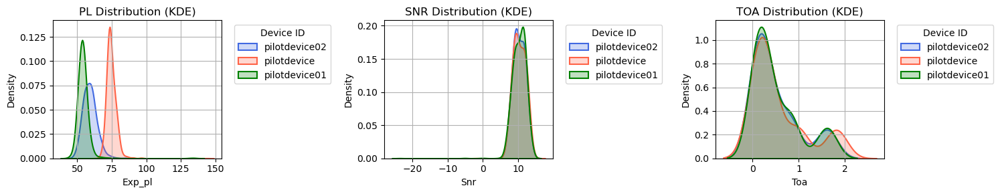

In [28]:
def plot_kde(ax, data, parameter, bw_adjust=2, title=''):
    """
    Plots a Kernel Density Estimate (KDE) for the given parameter, grouped by 'device_id'.

    Args:
    - ax (Axes): Matplotlib Axes object to plot on.
    - data (DataFrame): DataFrame containing sensor data with 'device_id' and the parameter to plot.
    - parameter (str): The parameter to plot (e.g., 'exp_pl', 'snr', 'toa').
    - bw_adjust (float): Bandwidth adjustment for the KDE plot.
    - title (str): The title of the plot.
    """
    # Define a pool of colors to use for different devices
    color_pool = itertools.cycle(['royalblue', 'tomato', 'green', 'purple', 'orange', 'cyan', 'magenta'])

    # Create a color map dynamically based on device_id
    colors = {device_id: next(color_pool) for device_id in data['device_id'].unique()}

    # Plot KDE for each device
    for device_id in data['device_id'].unique():
        subset = data[data['device_id'] == device_id]
        sns.kdeplot(
            subset[parameter], ax=ax, 
            label=device_id, 
            lw=1.5, 
            bw_adjust=bw_adjust, 
            fill=True, 
            color=colors[device_id]
        )
    
    ax.set_title(title)
    ax.set_xlabel(parameter.capitalize())
    ax.set_ylabel('Density')
    ax.grid(True)
    ax.legend(title='Device ID', bbox_to_anchor=(1.05, 1), loc='upper left')

# Use the cleaned_df DataFrame as is or filter it as needed
filtered_df = cleaned_df[cleaned_df['device_id'].isin(cleaned_df['device_id'].unique())]

# Set up the matplotlib figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 3))

# Plot each parameter on a separate subplot
plot_kde(axes[0], filtered_df, 'exp_pl', bw_adjust=2, title='PL Distribution (KDE)')
plot_kde(axes[1], filtered_df, 'snr', bw_adjust=2, title='SNR Distribution (KDE)')
plot_kde(axes[2], filtered_df, 'toa', bw_adjust=2, title='TOA Distribution (KDE)')

# Adjust layout
plt.tight_layout()
plt.show()


<p style="font-family: 'Courier New', Courier, monospace; font-size: 30px; font-weight: bold; color: blue;  text-align: left;">
 Heatmap Plots: Environmental Parameters based on hour of the day
</p>

In [30]:
# Select hour time from the set
cleaned_df['hour'] = cleaned_df['time'].dt.hour

# Select only numeric columns
numeric_cols = ['co2', 'humidity', 'pm25', 'pressure', 'temperature']

# Calculate the mean for the numeric columns grouped by device_id and hour
hourly_avg_per_device = cleaned_df.groupby(['device_id', 'hour'])[numeric_cols].mean().reset_index()

def plot_device_heatmap(device_data, device, numeric_cols):
    """
    Plots a heatmap of average environmental factors by hour for a given device.

    Args:
    - device_data (DataFrame): DataFrame containing average values for each hour.
    - device (str): Device ID to plot for.
    - numeric_cols (list): List of numeric columns to plot.
    """
    # Create a DataFrame to cover all hours (0-23)
    full_hours = pd.DataFrame(index=np.arange(0, 24), columns=numeric_cols)
    
    # Get the actual data for the device
    device_hourly_data = device_data[device_data['device_id'] == device].set_index('hour')[numeric_cols]
    
    # Merge actual data into the full hours DataFrame
    full_hours.update(device_hourly_data)
    
    # Convert the DataFrame to numeric, leaving NaNs as they are
    full_hours = full_hours.astype(float)  # Ensure all data is float type
    
    # Plot the heatmap
    plt.figure(figsize=(10, 2))
    sns.heatmap(full_hours.T, cmap='coolwarm', annot=False, cbar_kws={'label': 'Average Value'}, 
                xticklabels=np.arange(0, 24), yticklabels=numeric_cols, mask=full_hours.T.isna())
    
    plt.title(f'Average Environmental Factors by Hour for {device}')
    plt.xlabel('Hour')
    plt.ylabel('Environmental Factors')
    
    # Set x-ticks with labels
    plt.xticks(ticks=np.arange(0, 24), labels=np.arange(0, 24))
    
    plt.show()

# Plot heatmap for each device_id
unique_devices = cleaned_df['device_id'].unique()

for device in unique_devices:
    plot_device_heatmap(hourly_avg_per_device, device, numeric_cols)


AttributeError: Can only use .dt accessor with datetimelike values